# Visualizing VGG at different layers

## 1 Load VGG and test on some images
https://machinelearningmastery.com/use-pre-trained-vgg-model-classify-objects-photographs/
We used the above guide to load VGG and use it.

We chose VGG because it is a completely feed forward network. This makes the analysis of circuits much simpler and easier to do. Also VGG is conveniently trained in keras applications so it was easy to get up and running very quickly.

TODO: why did we choose VGG it is in the lecture 

In [1]:
from tensorflow import keras

In [2]:
import tensorflow as tf
from tensorflow.keras.applications.vgg19 import VGG19

In [3]:
model = tf.keras.applications.vgg19.VGG19()

In [4]:
model.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [5]:
from tensorflow import keras

In [6]:
tf.keras.utils.convert_all_kernels_in_model

<function tensorflow.python.keras.utils.layer_utils.convert_all_kernels_in_model(model)>

In [7]:
keras.__version__

'2.2.4-tf'

In [8]:
import tensorflow.core as tfcore

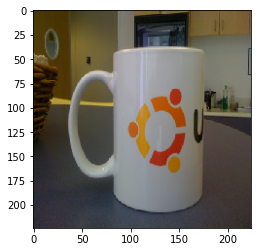

In [10]:
from matplotlib import pyplot as plt
from tensorflow.keras.preprocessing.image import load_img
image1 = load_img('UbuntuMug.jpg', target_size=(224, 224))
plt.imshow(image1)

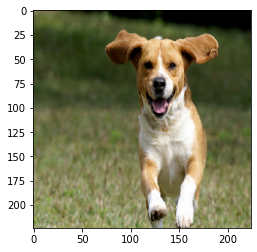

In [11]:
image2 = load_img('dog.jpeg', target_size=(224, 224))
plt.imshow(image2)

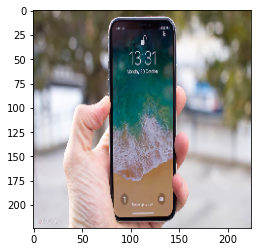

In [12]:
image3 = load_img('iphone.jpg', target_size=(224, 224))
plt.imshow(image3)

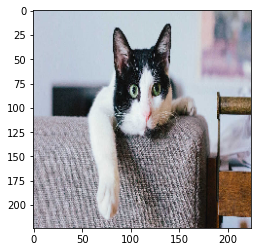

In [13]:
image4 = load_img('cat.jpg', target_size=(224, 224))
plt.imshow(image4)

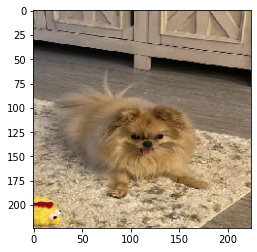

In [14]:
image5 = load_img('gigi.jpg', target_size=(224, 224))
plt.imshow(image5)

In [15]:
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.applications.vgg19 import decode_predictions


images = [image1, image2, image3, image4, image5]
for image in images:
    image_np = img_to_array(image)
    image_np = image_np.reshape((1, image_np.shape[0],
                                 image_np.shape[1],
                                 image_np.shape[2]))
    image_np = preprocess_input(image_np)
    
    yhat = model.predict(image_np)
    label = decode_predictions(yhat)
    label = label[0][0]
    print(f"{label[1]}, with certainty {label[2]*100}")
    
    

coffee_mug, with certainty 85.14823913574219
golden_retriever, with certainty 14.151574671268463
iPod, with certainty 79.24851775169373
basenji, with certainty 38.22553753852844
Pomeranian, with certainty 89.97217416763306


In [16]:
from tensorflow import keras
for layer in model.layers:
    print(layer.name)

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool
flatten
fc1
fc2
predictions


In [63]:
layer_name = "block3_conv1"
layer = model.get_layer(name=layer_name)
layer.output
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)

In [50]:
import tensorflow as tf

In [51]:
from tensorflow.keras.preprocessing.image import load_img
import numpy as np

In [52]:
# this function is pulled from the books code:
def get_img_array(img_path, target_size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=target_size)
    #img = keras.utils.load_img(
    #    img_path, target_size=target_size)
    array = img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

img_tensor = get_img_array("gigi.jpg", target_size=(224, 224))

activation = feature_extractor(
    keras.applications.vgg19.preprocess_input(img_tensor)
)


def compute_loss(image, filter_index):
    activation = feature_extractor(image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

In [53]:
@tf.function
def gradient_ascent_step(image, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image, filter_index)
    grads = tape.gradient(loss, image)
    grads = tf.math.l2_normalize(grads)
    image += learning_rate * grads
    return image

In [138]:
img_width = 224
img_height = 224

def generate_filter_pattern(filter_index, learning_rate = 10., iterations = 30):
    image = tf.random.uniform(
        minval=0.4,
        maxval=0.6,
        shape=(1, img_width, img_height, 3))
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)
    return image[0].numpy()

In [139]:
def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :]
    return image

In [167]:
layer_name = "block5_conv3"
layer = model.get_layer(name=layer_name)
layer.output
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)

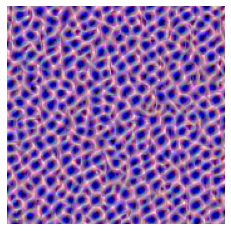

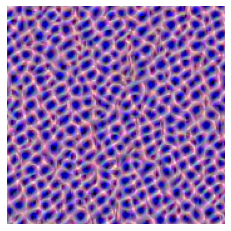

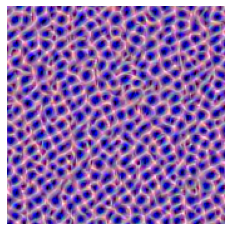

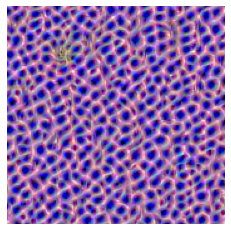

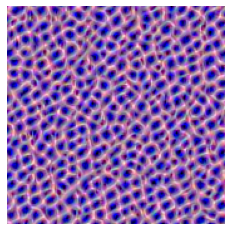

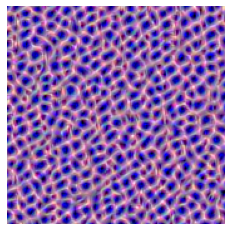

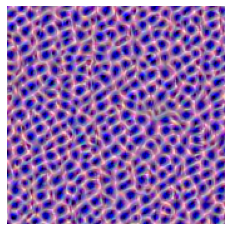

Wall time: 5.02 s


In [233]:
%%time
plt.axis("off")
layer_name = "block1_conv1"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=0,
                                                   learning_rate=10.,
                                                   iterations=100)))
plt.show()

plt.axis("off")
layer_name = "block1_conv2"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=0,
                                                   learning_rate=10.,
                                                   iterations=100)))
plt.show()

plt.axis("off")
layer_name = "block2_conv1"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=0,
                                                   learning_rate=10.,
                                                   iterations=100)))
plt.show()

plt.axis("off")
layer_name = "block2_conv2"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=0,
                                                   learning_rate=10.,
                                                   iterations=100)))
plt.show()

plt.axis("off")
layer_name = "block3_conv1"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=0,
                                                   learning_rate=10.,
                                                   iterations=100)))


plt.axis("off")
layer_name = "block3_conv2"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=0,
                                                   learning_rate=10.,
                                                   iterations=100)))
plt.show()

plt.axis("off")
layer_name = "block3_conv3"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=0,
                                                   learning_rate=10.,
                                                   iterations=100)))
plt.show()

plt.axis("off")
layer_name = "block3_conv4"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=0,
                                                   learning_rate=10.,
                                                   iterations=100)))
plt.show()

## Plot all of a layer

In [219]:
def plot_gallery(images, titles, h, w, n_row=3, n_col=6, skip=0, step=1):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row *0.8))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=0)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[(i * step) + skip],cmap='bone')
        plt.axis('off')
        plt.title(titles[i])
    plt.show()

Channels running:   0%|          | 0/256 [00:00<?, ?it/s]

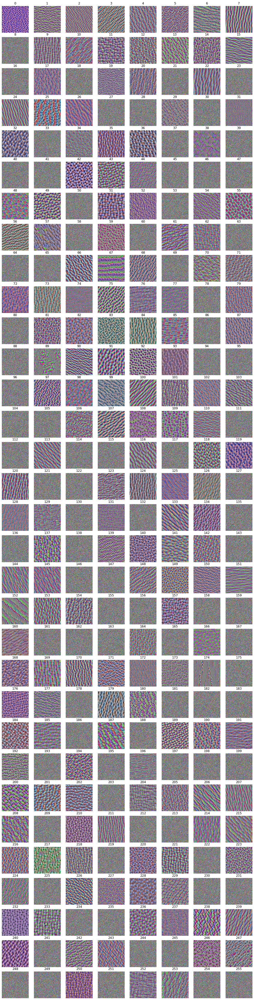

Wall time: 5min 44s


In [221]:
%%time
from tqdm.auto import tqdm
def plot_entire_layer(layer_name, nchannels):
    images = []
    layer = model.get_layer(name=layer_name)
    feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
    
    pbar = tqdm(desc="Channels running: ", total=nchannels)
    for i in range(nchannels):
        images.append(deprocess_image(generate_filter_pattern(filter_index=i,
                                                              learning_rate=10.,
                                                              iterations=150)))
        pbar.update(1)
        
    plot_gallery(images,
                [i for i in range(nchannels)],
                img_width, img_height,
                n_row=nchannels//8,
                n_col=8)
        

plot_entire_layer("block3_conv3", 256)

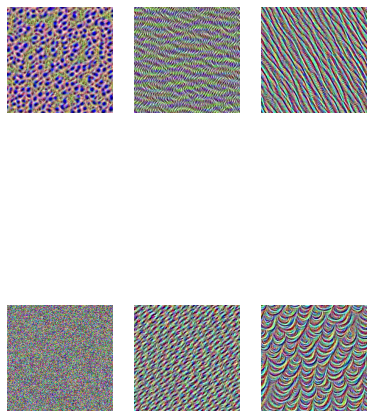

In [193]:
plot_entire_layer("block3_conv4", 6)

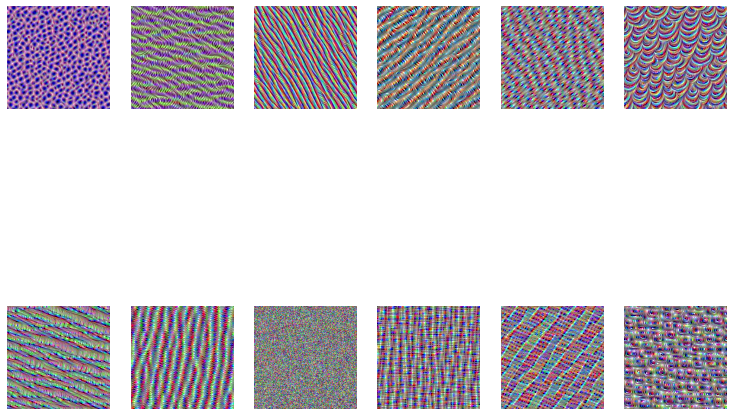

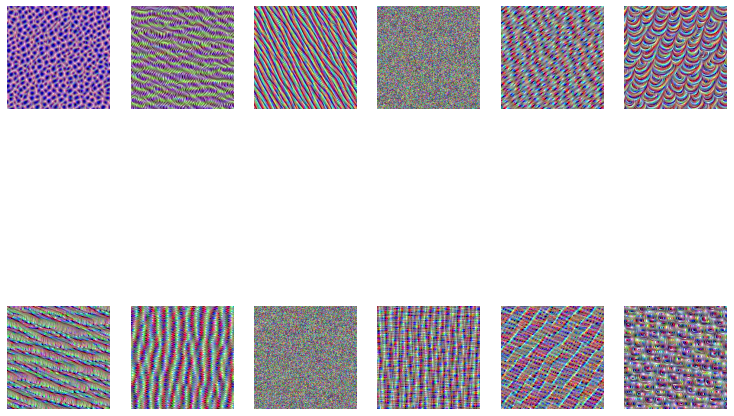

In [183]:
plot_entire_layer("block1_conv1", 12)
plot_entire_layer("block3_conv4", 12)

In [ ]:
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool